# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 6.5 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=041c63d3b653bec85ca58ea8e08f9e48a746027c9eee560a20fe57302a956d15
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Cloning into 'detectron2'...
remote: Enumerating objects: 14718, done.
remote: Counting objects: 100% (134/134), done.
remote: Compressing objects:

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on custom dataset

## Preparing the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [7]:
from detectron2.data.datasets import load_coco_json
from detectron2.structures import BoxMode

# Change paths if necessary
annotations_path = "drive/MyDrive/Fall-2022/CS-482/project/dataset/annotations/instances_default.json"
images_path = "drive/MyDrive/Fall-2022/CS-482/project/dataset/images"

# Classes
classes = ["blender","coffee mug","dishwasher","knife","microwave","plate","refrigerator","skillet","spatula","toaster"]

In [6]:
def get_kitchen_dicts(annotations_path, images_path):
    dicts = load_coco_json(annotations_path, images_path, "kitchen_train")
    for d in dicts:
        for anno in d["annotations"]:
            if("segmentation" not in anno.keys()):
                x,y,w,h = anno['bbox']
                anno['segmentation'] = [[x+w,y, x,y,  x,y+h, x+w,y+h]]
                anno['area'] = w*h
    return dicts
def split_dataset(dataset_dicts):
    random.seed(42)
    random.shuffle(dataset_dicts)
    n = len(dataset_dicts)
    return dataset_dicts[:int(n*0.8)], dataset_dicts[int(n*0.8):]

def reflect_dict(d):
    return d

kitchen_dataset_dicts = get_kitchen_dicts(annotations_path, images_path)
kitchen_train, kitchen_val = split_dataset(kitchen_dataset_dicts)



[12/23 03:22:39 d2.data.datasets.coco]: Loaded 945 images in COCO format from drive/MyDrive/Fall-2022/CS-482/project/dataset/annotations/instances_default.json


In [8]:
DatasetCatalog.register("kitchen_train", lambda: reflect_dict(kitchen_train))
MetadataCatalog.get("kitchen_train").set(thing_classes=classes)

DatasetCatalog.register("kitchen_val", lambda: reflect_dict(kitchen_val))
MetadataCatalog.get("kitchen_val").set(thing_classes=classes)

kitchen_metadata = MetadataCatalog.get("kitchen_train") 

To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



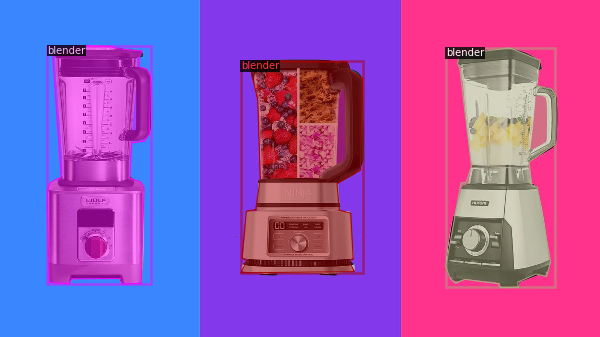

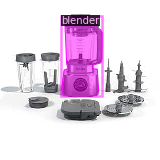

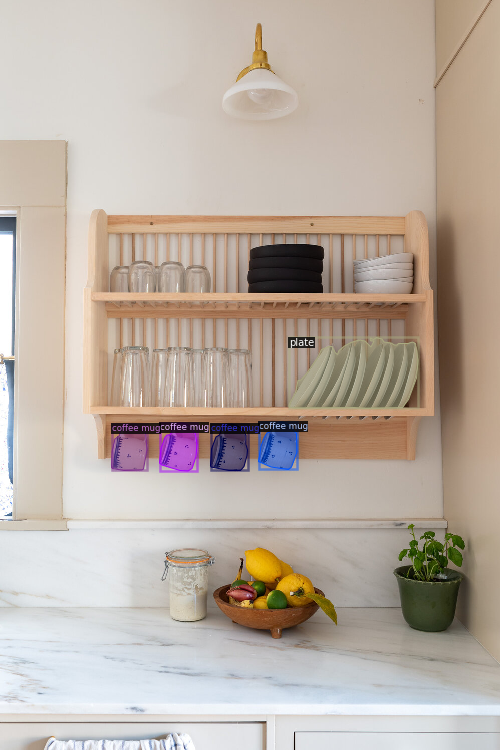

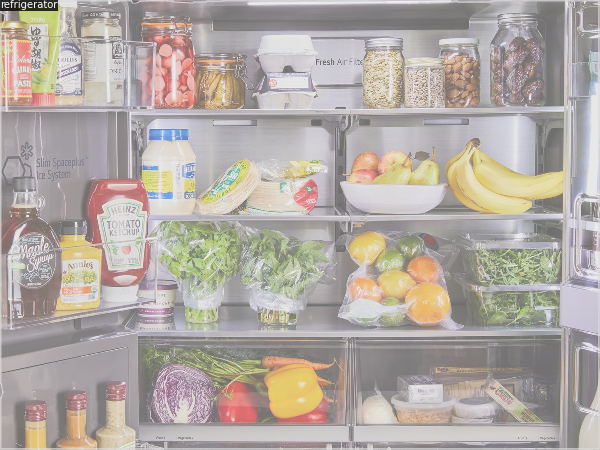

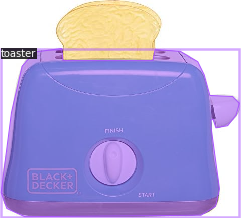

In [31]:
for d in random.sample(kitchen_train, 5):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=kitchen_metadata, scale=0.5)
    try:
      out = visualizer.draw_dataset_dict(d)
      cv2_imshow(out.get_image()[:, :, ::-1])
    except:
      print(d["file_name"])

## Training

Fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the custom dataset.


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("kitchen_train",)
cfg.DATASETS.TEST = ("kitchen_val")
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.001 #0.00025 
cfg.SOLVER.MAX_ITER = 600    
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10   

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [12]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.60   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[12/23 03:31:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

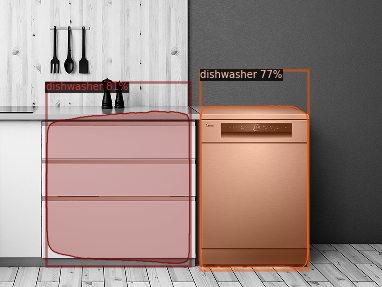

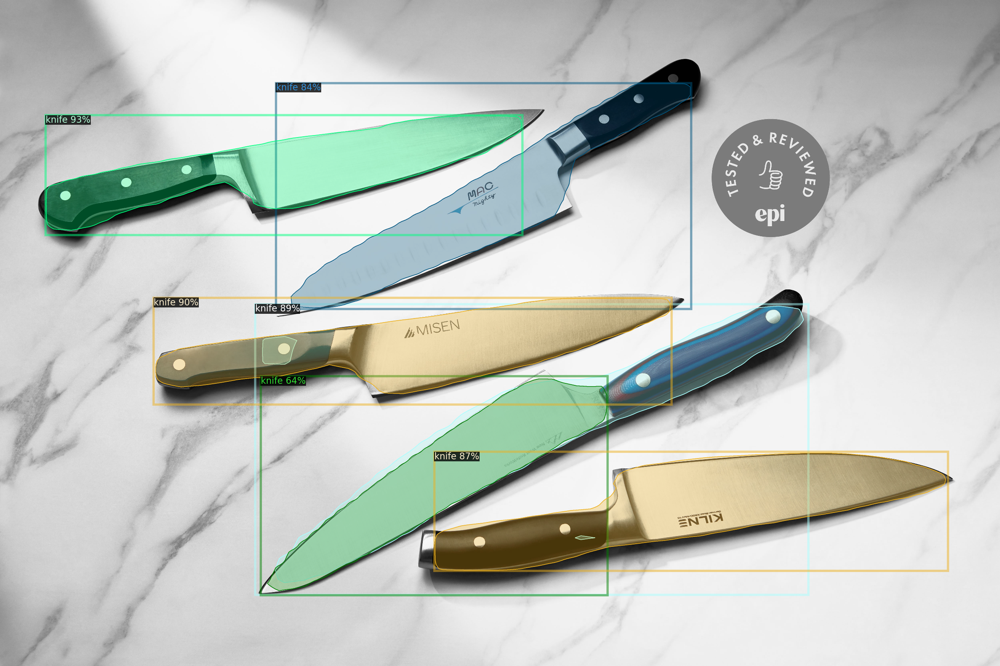

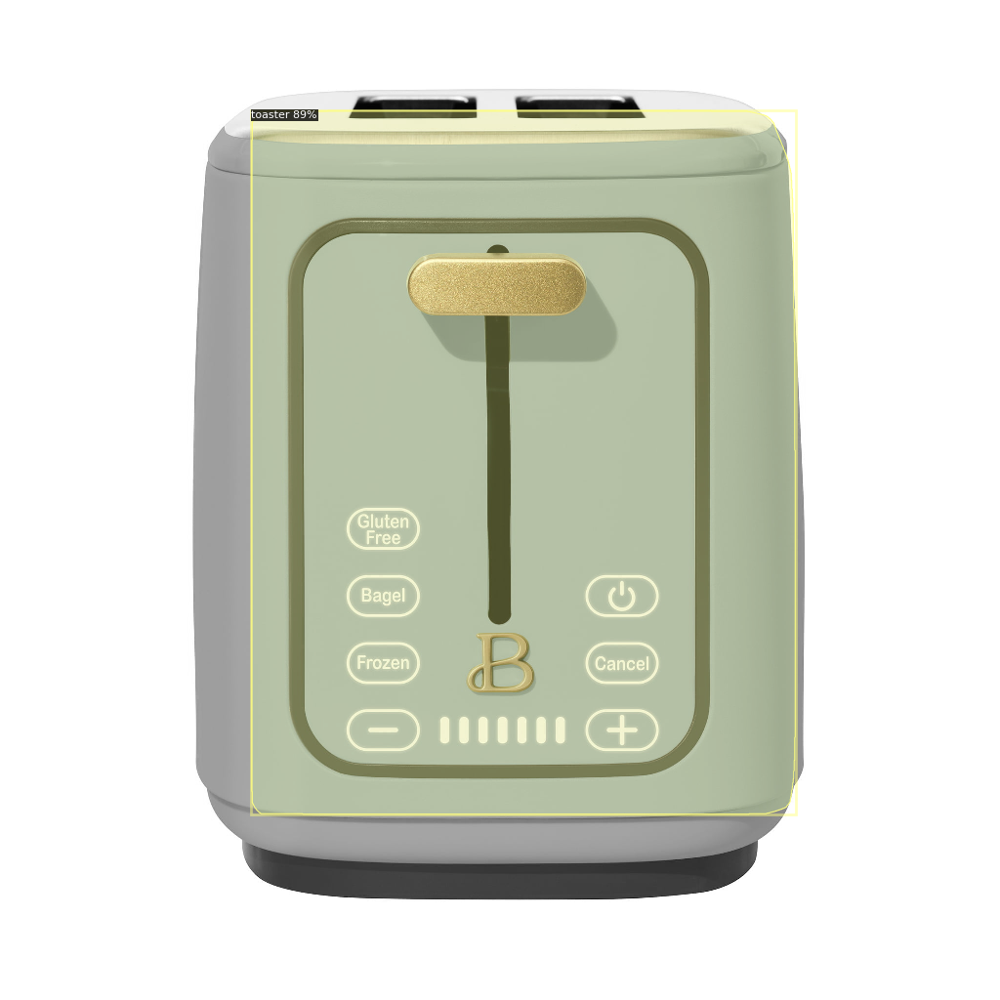

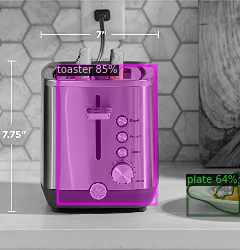

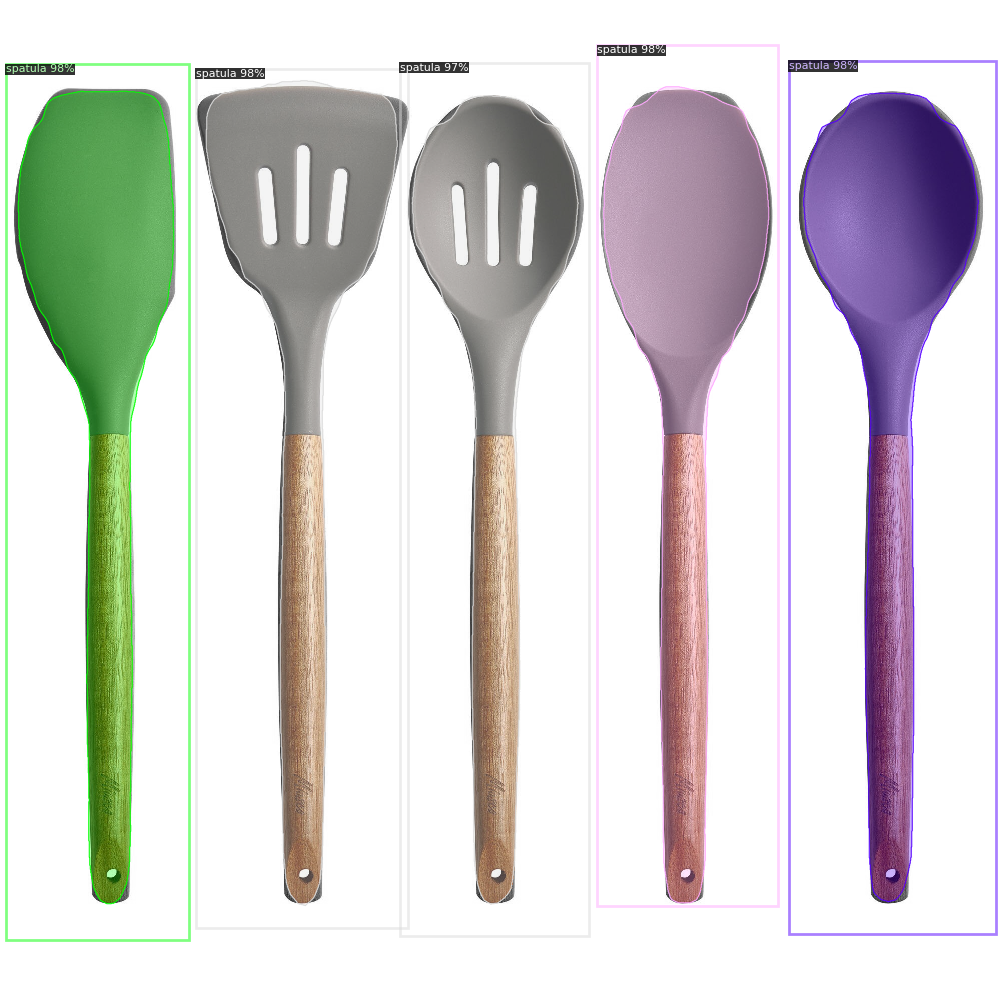

In [15]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(kitchen_val, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=kitchen_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [16]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("kitchen_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "kitchen_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`
#print(trainer.test(cfg=cfg, model=predictor.model))
#results = trainer.test(cfg=cfg, model=predictor.model)

[12/23 03:32:58 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[12/23 03:32:58 d2.evaluation.coco_evaluation]: Trying to convert 'kitchen_val' to COCO format ...
[12/23 03:32:58 d2.data.datasets.coco]: Converting annotations of dataset 'kitchen_val' to COCO format ...)
[12/23 03:32:58 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[12/23 03:32:58 d2.data.datasets.coco]: Conversion finished, #images: 189, #annotations: 462
[12/23 03:32:58 d2.data.datasets.coco]: Caching COCO format annotations at './output/kitchen_val_coco_format.json' ...
[12/23 03:32:58 d2.data.build]: Distribution of instances among all 10 categories:
|   category   | #instances   |  category  | #instances   |  category  | #instances   |
|:------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   blender    | 25           | coffee mug | 151          | dishwasher | 23           |
|    knife     | 42           | microwa

# Running the model on Home Depot Video

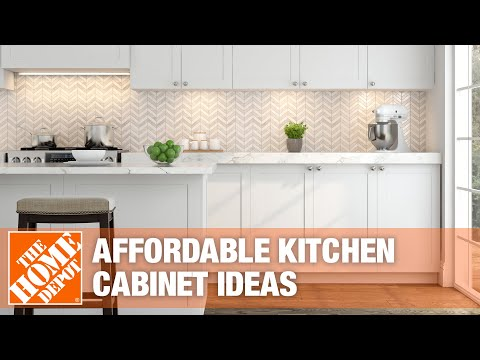

In [18]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("Rt-4Q0Yg2RY", width=500)
display(video)

In [17]:
# Install dependencies, download the video, and crop 5 seconds for processing
!pip install youtube-dl
!youtube-dl https://www.youtube.com/watch?v=Rt-4Q0Yg2RY -f 22 -o video.mp4
!ffmpeg -i video.mp4 -t 00:00:30 -c:v copy video-clip.mp4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 5.6 MB/s 
[youtube] Rt-4Q0Yg2RY: Downloading webpage
[download] Destination: video.mp4
[download] 100% of 27.61MiB in 06:49
ffmpeg version 3.4.11-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable

In [28]:
def infer_video(video_path, output_fname, predictor):
    video = cv2.VideoCapture(video_path)
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
    basename = os.path.basename(video_path)

    codec, file_ext = ("mp4v", ".mp4")
    output_file = cv2.VideoWriter(
                filename=output_fname,
                # some installation of opencv may not support x264 (due to its license),
                # you can try other format (e.g. MPEG)
                fourcc=cv2.VideoWriter_fourcc(*codec),
                fps=float(frames_per_second),
                frameSize=(width, height),
                isColor=True,
            )
    if(video.isOpened()==False):
      print("Error opening video")
      return
    (success, im) = video.read()
    vis_frames = []
    while(success): 
      outputs = predictor(im)
      v = Visualizer(im[:, :, ::-1],
                     metadata=kitchen_metadata, 
                     scale=0.5, 
                     instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
      )
      out = v.draw_instance_predictions(outputs["instances"].to("cpu")) 
      vis_frames.append(out.get_image()[:, :, ::-1])
      (success, im) = video.read()

    for vis_frame in vis_frames:
      output_file.write(vis_frame)


In [29]:
infer_video("./video-clip.mp4", "segmented-clip.mp4", predictor)